In [1]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using .Src

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


In [2]:
# set true model parameters
a_true = 0.9 # at bifurcation point
m_true = 0.45
n0 = 1.5
w0 = 0.2
M = 100 # number of measurements
noise = 0.5

# create parameter object for trial
hprm = Hyperprm(w0, n0, a_true, m_true, M, noise);

## fixed time window, observe from t=0

In [3]:
# observation time window fixed
t_fixed = true

true

### infer a,m

In [4]:
# infer a,m parameter
prm_keys = [:a, :m];

In [5]:
# inverse uq and practical identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [0.9181701428884782, 0.45731275210204647], plot_mles = Plot{Plots.GRBackend() n=12}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.9992612405201183; 0.999261240519112 1.0], cov = [0.025041063266692736 0.01228398324861963; 0.01228398324860726 0.006034865301467299], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

In [35]:
# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed, n0=n0, w0=w0)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

### analyze plots

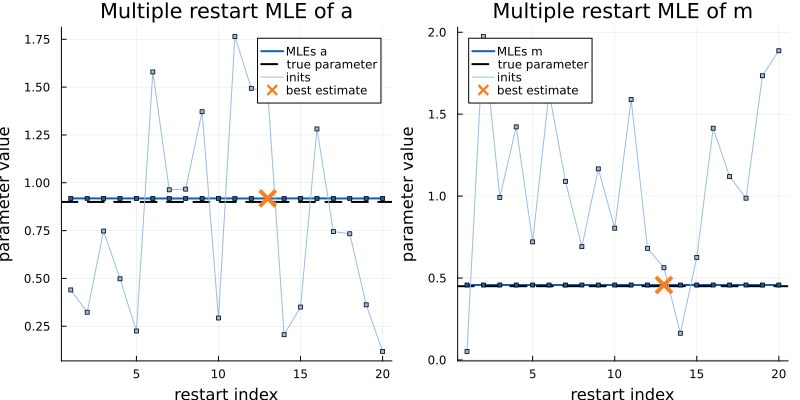

In [7]:
r.plot_mles

In [8]:
r.cor

2×2 Matrix{Float64}:
 1.0       0.999261
 0.999261  1.0

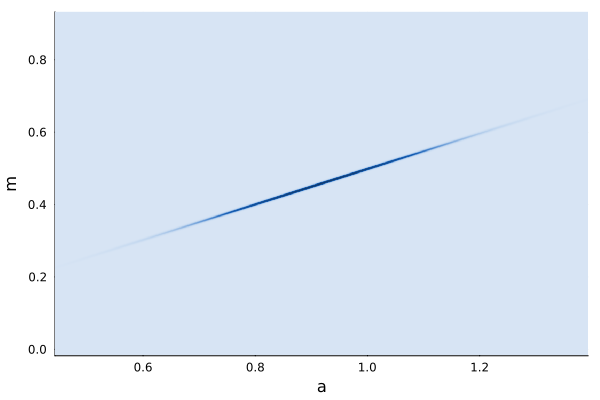

In [9]:
r.gaussian_heatmap

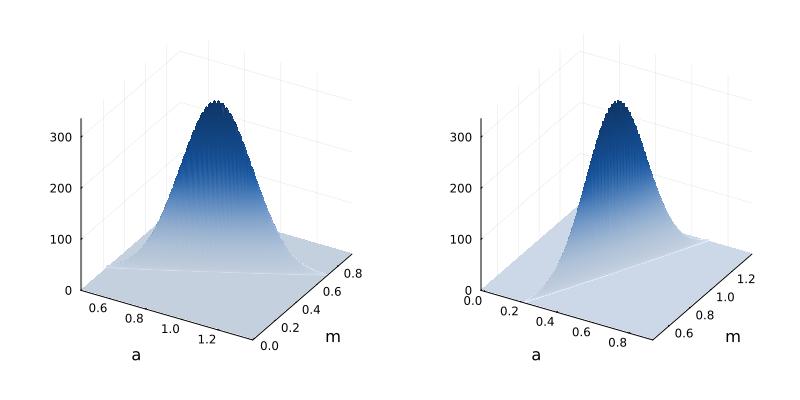

In [10]:
r.gaussian_surface

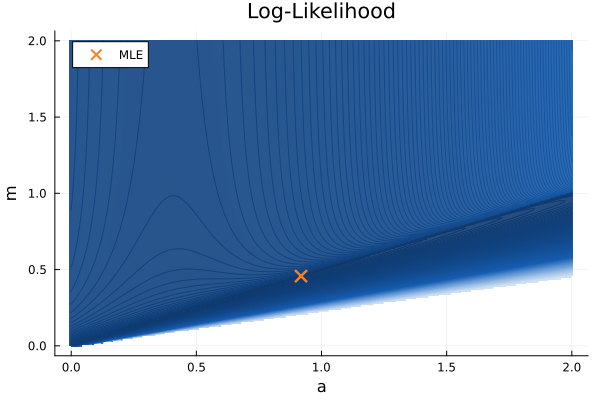

In [11]:
analyze_ll(r.mle, prm_keys, hprm, -1000, t_fixed=t_fixed)

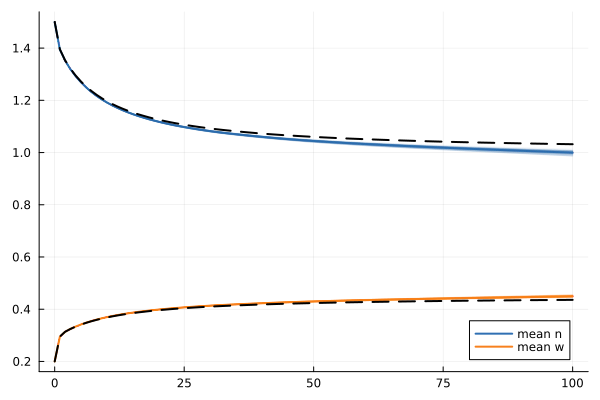

In [36]:
rf.trajectories

### infer a

In [13]:
prm_keys= [:a];

In [39]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed, n0=n0, w0=w0)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

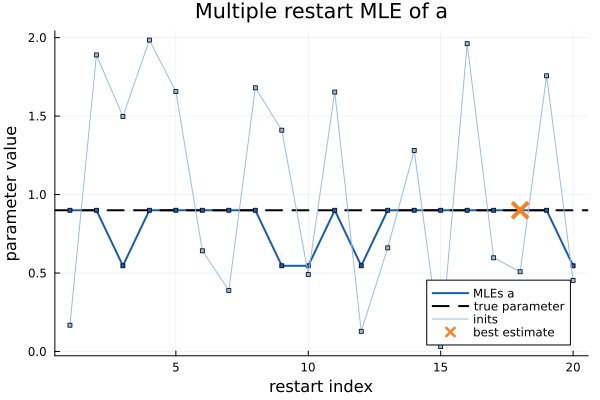

In [15]:
r.plot_mles

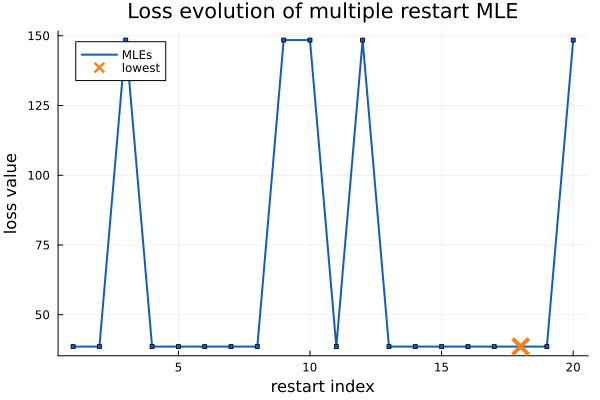

In [16]:
r.plot_losses

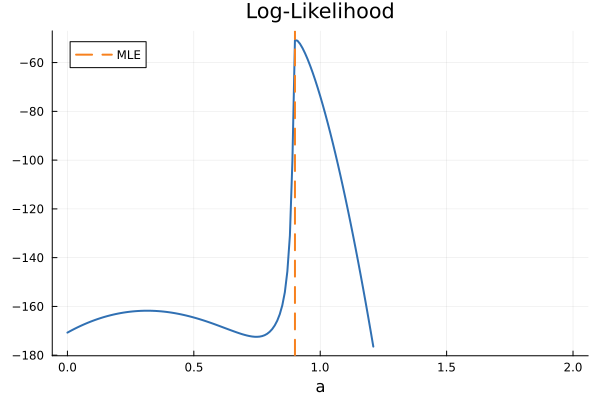

In [17]:
analyze_ll(r.mle,prm_keys, hprm, -180, t_fixed=t_fixed)

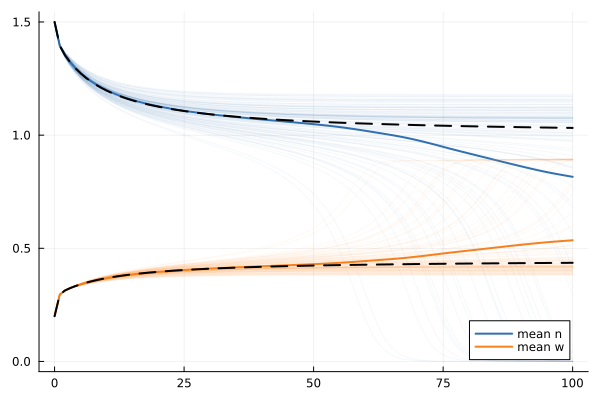

In [40]:
rf.trajectories

In [19]:
r.cov

1×1 Matrix{Float64}:
 2.1221533592896534e-5

## fixed time window, observe stable state only

In [20]:
# observation time window fixed
t_fixed = true

# observations in stable state only
obs_late = true
t_end = 200.0; # observe system for a longer time in this case

### infer a,m

In [21]:
# infer a,m parameter
prm_keys = [:a, :m];

In [41]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed, t_end=t_end, n0=n0, w0=w0)


(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

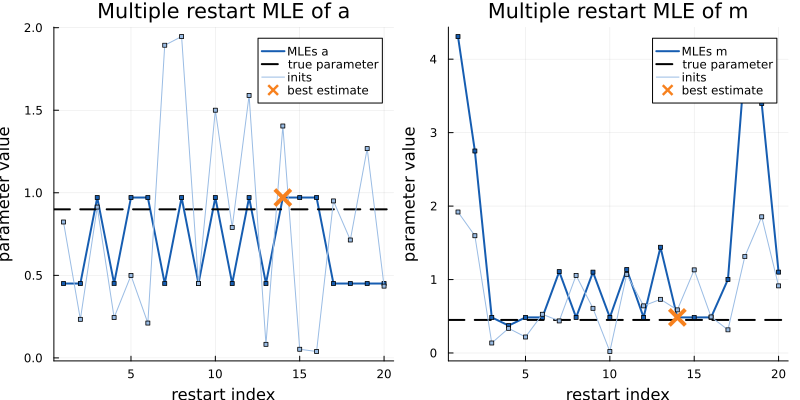

In [23]:
r.plot_mles

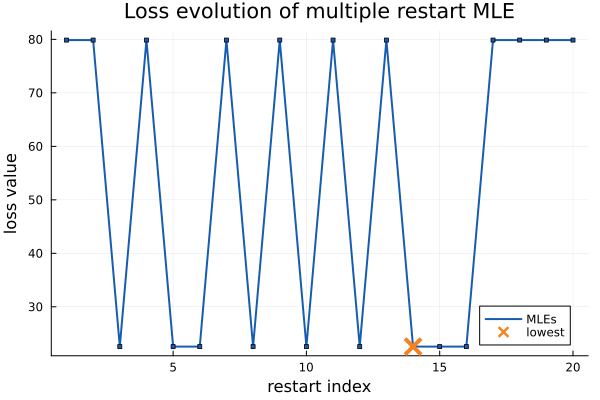

In [24]:
r.plot_losses

In [25]:
r.cor

2×2 Matrix{Float64}:
 1.0       0.999698
 0.999698  1.0

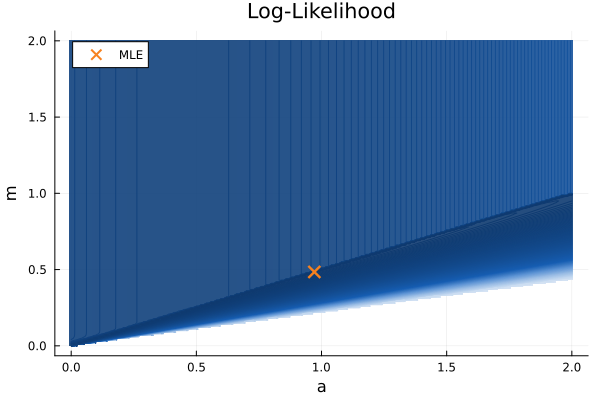

In [26]:
analyze_ll(r.mle, prm_keys, hprm,-600, t_fixed=t_fixed,obs_late=obs_late,t_end=200.0)

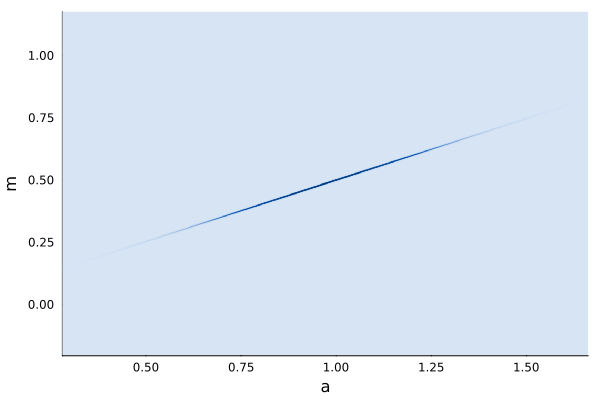

In [27]:
r.gaussian_heatmap

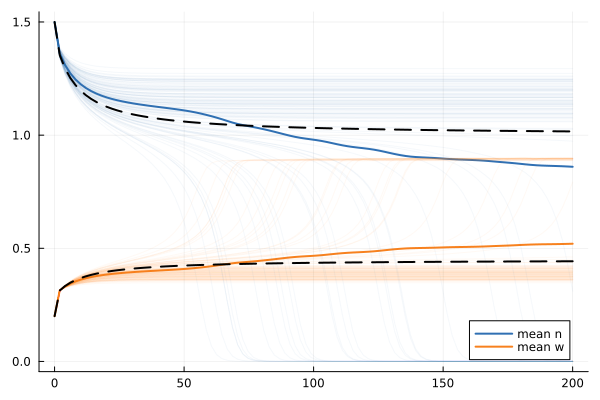

In [42]:
rf.trajectories

### infer a

In [29]:
prm_keys = [:a];

In [43]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true], t_fixed=t_fixed, t_end=t_end, n0=n0, w0=w0)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

In [31]:
r.cov

1×1 Matrix{Float64}:
 2.38046527541082e-8

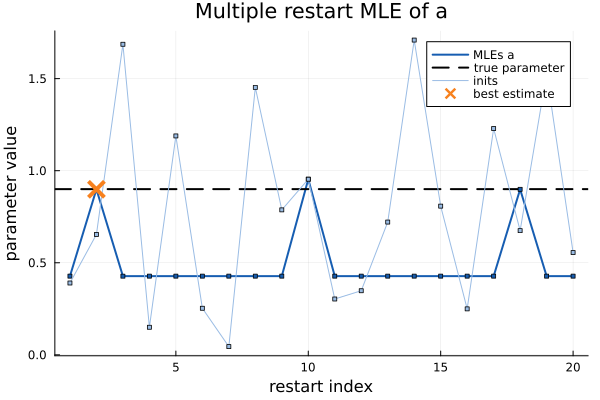

In [32]:
r.plot_mles

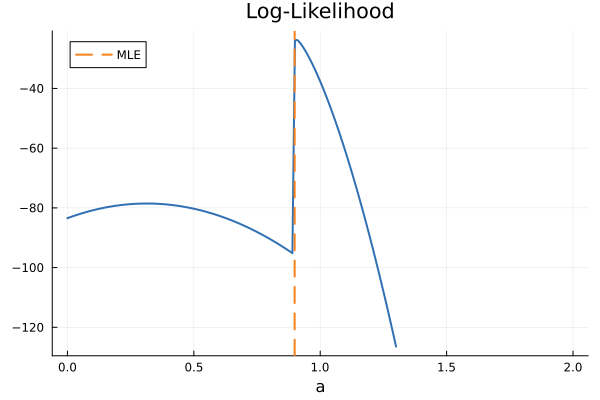

In [33]:
analyze_ll(r.mle, prm_keys, hprm,-130, t_fixed=t_fixed,obs_late=obs_late, t_end=200.0)

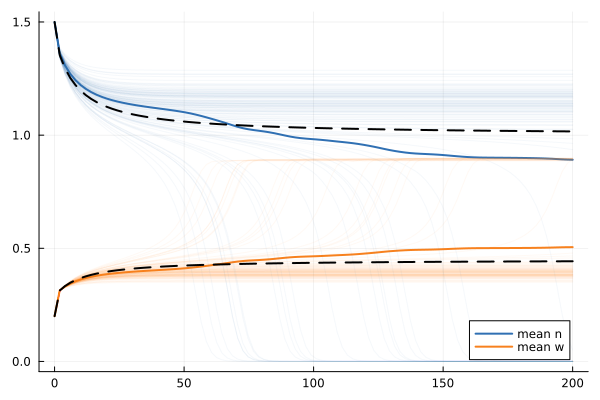

In [44]:
rf.trajectories